In [1]:
import pandas as pd
import sqlite3
import matplotlib
import ipywidgets
import matplotlib.pyplot as plt
import regex as re
import bqplot
import numpy as np
import seaborn as sb

import plotly.graph_objects as go
import networkx as nx

In [2]:
principals = pd.read_csv('Imdb_data/title.principals.tsv',delimiter='\t')
basics = pd.read_csv('Imdb_data/title.basics.tsv',delimiter='\t')
imdb_names = pd.read_csv('Imdb_data/name.basics.tsv',delimiter='\t')

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (4,5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
wiki_cast_excel = pd.read_csv('wiki_cast_excel.csv')
wiki_cast_excel.iloc[29]
wiki_cast = wiki_cast_excel.fillna('No')
wiki_cast

,Performer,Time on SNL,No. of seasons,Repertory Player,Featured Player,Middle Group,"""Weekend Update"" Anchor",Hosted,Writer
0,Fred Armisen,2002–2013,11,Yes,Yes,No,No,Yes,No
1,Aristotle Athari,2021–present,1,No,Yes,No,No,No,No
2,Dan Aykroyd,1975–1979,4,Yes,No,No,Yes,Yes,Yes
3,Peter Aykroyd,1980,1,No,Yes,No,No,No,Yes
4,Morwenna Banks,1995,1,Yes,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...
154,Casey Wilson,2008–2009,2,No,Yes,No,No,No,No
155,Fred Wolf,1996–1996,2,No,Yes,No,No,No,Yes
156,Bowen Yang,2019–present,3,Yes,Yes,No,No,No,Yes
157,Sasheer Zamata,2014–2017,4,Yes,Yes,No,No,No,No


Text(0, 0.5, 'No. of Seasons')

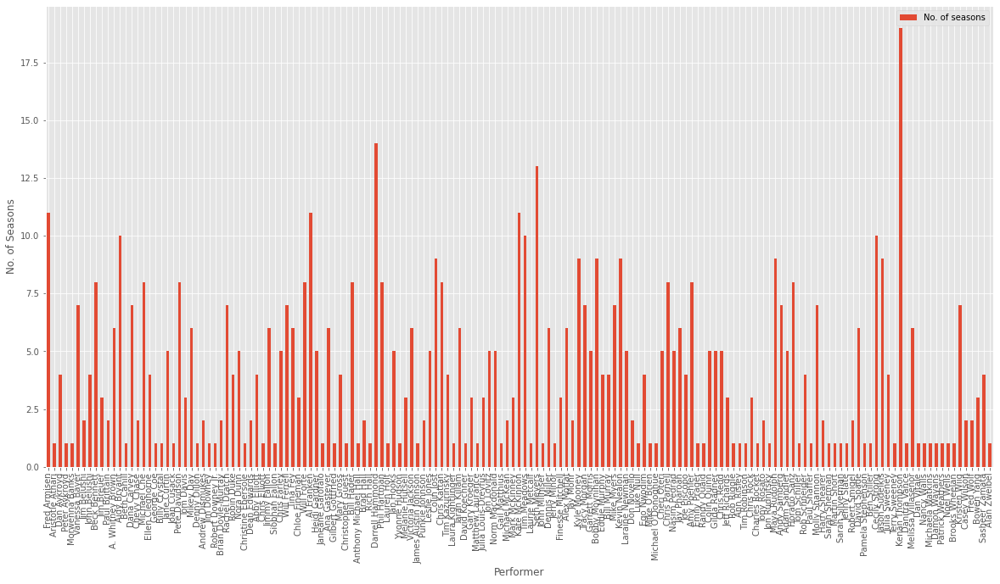

In [4]:
plt.style.use('ggplot')
ax = wiki_cast.plot(x= "Performer",y="No. of seasons", figsize = (20,10), kind = 'bar')
ax.set_ylabel('No. of Seasons')

In [5]:
imdb_names_df = imdb_names
imdb_names_df

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"soundtrack,actor,miscellaneous","tt0050419,tt0053137,tt0031983,tt0072308"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack","tt0071877,tt0037382,tt0117057,tt0038355"
2,nm0000003,Brigitte Bardot,1934,\N,"actress,soundtrack,music_department","tt0054452,tt0056404,tt0057345,tt0049189"
3,nm0000004,John Belushi,1949,1982,"actor,soundtrack,writer","tt0078723,tt0072562,tt0077975,tt0080455"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0069467,tt0083922,tt0060827,tt0050986"
...,...,...,...,...,...,...
11554305,nm9993714,Romeo del Rosario,\N,\N,"animation_department,art_department","tt14069590,tt11657662,tt2455546"
11554306,nm9993716,Essias Loberg,\N,\N,NaN,\N
11554307,nm9993717,Harikrishnan Rajan,\N,\N,cinematographer,tt8736744
11554308,nm9993718,Aayush Nair,\N,\N,cinematographer,\N


In [6]:
imdb_name_list = imdb_names_df.values.tolist()
imdb_names_df.columns.tolist()

['nconst',
 'primaryName',
 'birthYear',
 'deathYear',
 'primaryProfession',
 'knownForTitles']

In [7]:
cross_imdb_wiki_list = []
for person in imdb_name_list:
    if person[1] in wiki_cast['Performer'].values:
        cross_imdb_wiki_list.append(person)

In [8]:
cross_name_list = (set([r[1] for r in cross_imdb_wiki_list]))
len(cross_name_list) # <- Missing 2 cast members

157

In [9]:
from collections import Counter

Counter([r[1] for r in cross_imdb_wiki_list]).most_common(10)

[('Tom Davis', 56),
 ("Mike O'Brien", 56),
 ('Bill Murray', 35),
 ('Tim Robinson', 32),
 ('Leslie Jones', 26),
 ('Chris Elliott', 24),
 ('Mike Myers', 23),
 ('Jeff Richards', 23),
 ('Dennis Miller', 21),
 ('Victoria Jackson', 18)]

In [10]:
cross_imdb_wiki_list

[['nm0000004',
  'John Belushi',
  '1949',
  '1982',
  'actor,soundtrack,writer',
  'tt0078723,tt0072562,tt0077975,tt0080455'],
 ['nm0000101',
  'Dan Aykroyd',
  '1952',
  '\\N',
  'writer,actor,producer',
  'tt0097428,tt0118747,tt0087332,tt0080455'],
 ['nm0000195',
  'Bill Murray',
  '1950',
  '\\N',
  'actor,soundtrack,writer',
  'tt1748122,tt0128445,tt0362270,tt0335266'],
 ['nm0000196',
  'Mike Myers',
  '1963',
  '\\N',
  'actor,writer,soundtrack',
  'tt0295178,tt0145660,tt0118655,tt0811138'],
 ['nm0000331',
  'Chevy Chase',
  '1943',
  '\\N',
  'actor,writer,soundtrack',
  'tt0085995,tt0097958,tt0080487,tt0092086'],
 ['nm0000345',
  'Billy Crystal',
  '1948',
  '\\N',
  'actor,writer,producer',
  'tt0101587,tt0098635,tt0113097,tt0122933'],
 ['nm0000349',
  'Joan Cusack',
  '1962',
  '\\N',
  'actress,soundtrack,writer',
  'tt0119229,tt1659337,tt0119360,tt0096463'],
 ['nm0000375',
  'Robert Downey Jr.',
  '1965',
  '\\N',
  'actor,producer,soundtrack',
  'tt1300854,tt0371746,tt4154

In [11]:
def check_names(name):
    cross_name_list = (set([r[1] for r in cross_imdb_wiki_list]))
    result = False
    
    if name in cross_name_list:
        result = True
    return result
SNL_name_check = [r for r in cross_imdb_wiki_list if check_names(r[1])]
(SNL_name_check)

[['nm0000004',
  'John Belushi',
  '1949',
  '1982',
  'actor,soundtrack,writer',
  'tt0078723,tt0072562,tt0077975,tt0080455'],
 ['nm0000101',
  'Dan Aykroyd',
  '1952',
  '\\N',
  'writer,actor,producer',
  'tt0097428,tt0118747,tt0087332,tt0080455'],
 ['nm0000195',
  'Bill Murray',
  '1950',
  '\\N',
  'actor,soundtrack,writer',
  'tt1748122,tt0128445,tt0362270,tt0335266'],
 ['nm0000196',
  'Mike Myers',
  '1963',
  '\\N',
  'actor,writer,soundtrack',
  'tt0295178,tt0145660,tt0118655,tt0811138'],
 ['nm0000331',
  'Chevy Chase',
  '1943',
  '\\N',
  'actor,writer,soundtrack',
  'tt0085995,tt0097958,tt0080487,tt0092086'],
 ['nm0000345',
  'Billy Crystal',
  '1948',
  '\\N',
  'actor,writer,producer',
  'tt0101587,tt0098635,tt0113097,tt0122933'],
 ['nm0000349',
  'Joan Cusack',
  '1962',
  '\\N',
  'actress,soundtrack,writer',
  'tt0119229,tt1659337,tt0119360,tt0096463'],
 ['nm0000375',
  'Robert Downey Jr.',
  '1965',
  '\\N',
  'actor,producer,soundtrack',
  'tt1300854,tt0371746,tt4154

In [12]:
def check_creds(works):
    SNL_IDs = ['tt0715791', 'tt0715791', 'tt0971348', 'tt10809086', 'tt0072562', 'tt1372614', 'tt2173702']
    result = False
    for work in works.split(','):
        if work in SNL_IDs:
            result = True
    return result
SNL_cred_check = [r for r in cross_imdb_wiki_list if check_creds(r[5])]
(SNL_cred_check)

[['nm0000004',
  'John Belushi',
  '1949',
  '1982',
  'actor,soundtrack,writer',
  'tt0078723,tt0072562,tt0077975,tt0080455'],
 ['nm0000902',
  'Jim Belushi',
  '1954',
  '\\N',
  'actor,music_department,producer',
  'tt0097637,tt0072562,tt0117468,tt0095963'],
 ['nm0001022',
  'Dana Carvey',
  '1955',
  '\\N',
  'actor,soundtrack,writer',
  'tt0072562,tt0108525,tt0105793,tt0295427'],
 ['nm0005265',
  'Kevin Nealon',
  '1953',
  '\\N',
  'actor,writer,soundtrack',
  'tt0072562,tt0116483,tt0439100,tt0120888'],
 ['nm0035488',
  'Fred Armisen',
  '1966',
  '\\N',
  'music_department,actor,writer',
  'tt0357413,tt1282140,tt0072562,tt1780441'],
 ['nm0112944',
  'A. Whitney Brown',
  '1952',
  '\\N',
  'writer,actor',
  'tt0096708,tt0072562,tt0166039,tt1094991'],
 ['nm0128639',
  'Beth Cahill',
  '\\N',
  '\\N',
  'actress,costume_designer,miscellaneous',
  'tt0155764,tt0262411,tt0164930,tt0072562'],
 ['nm0205569',
  'Tom Davis',
  '1952',
  '2012',
  'writer,actor,producer',
  'tt0086465,tt

In [13]:
SNL_df = pd.DataFrame(SNL_cred_check, columns = imdb_names.columns.tolist()).set_index('primaryName')
SNL_df

,nconst,birthYear,deathYear,primaryProfession,knownForTitles
primaryName,,,,,
John Belushi,nm0000004,1949,1982,"actor,soundtrack,writer","tt0078723,tt0072562,tt0077975,tt0080455"
Jim Belushi,nm0000902,1954,\N,"actor,music_department,producer","tt0097637,tt0072562,tt0117468,tt0095963"
Dana Carvey,nm0001022,1955,\N,"actor,soundtrack,writer","tt0072562,tt0108525,tt0105793,tt0295427"
Kevin Nealon,nm0005265,1953,\N,"actor,writer,soundtrack","tt0072562,tt0116483,tt0439100,tt0120888"
Fred Armisen,nm0035488,1966,\N,"music_department,actor,writer","tt0357413,tt1282140,tt0072562,tt1780441"
...,...,...,...,...,...
Aidy Bryant,nm5262775,1987,\N,"actress,writer,soundtrack","tt5462602,tt11092142,tt8962130,tt0072562"
Chris Redd,nm5412083,\N,\N,"actor,writer,soundtrack","tt3960412,tt5884792,tt7286456,tt0072562"
Fred Wolf,nm7440291,\N,\N,actor,"tt3910602,tt10222674,tt0072562"


In [14]:
wiki_cast = wiki_cast.set_index('Performer')
imdb_wiki_table = pd.concat([SNL_df, wiki_cast], axis=1, join="outer")
imdb_wiki_table

,nconst,birthYear,deathYear,primaryProfession,knownForTitles,Time on SNL,No. of seasons,Repertory Player,Featured Player,Middle Group,"""Weekend Update"" Anchor",Hosted,Writer
John Belushi,nm0000004,1949,1982,"actor,soundtrack,writer","tt0078723,tt0072562,tt0077975,tt0080455",1975–1979,4,Yes,No,No,No,No,Yes
Jim Belushi,nm0000902,1954,\N,"actor,music_department,producer","tt0097637,tt0072562,tt0117468,tt0095963",1983–1985,2,Yes,No,No,No,No,Yes
Dana Carvey,nm0001022,1955,\N,"actor,soundtrack,writer","tt0072562,tt0108525,tt0105793,tt0295427",1986–1993,7,Yes,No,No,No,Yes,Yes
Kevin Nealon,nm0005265,1953,\N,"actor,writer,soundtrack","tt0072562,tt0116483,tt0439100,tt0120888",1986–1995,9,Yes,Yes,No,Yes,No,Yes
Fred Armisen,nm0035488,1966,\N,"music_department,actor,writer","tt0357413,tt1282140,tt0072562,tt1780441",2002–2013,11,Yes,Yes,No,No,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Patrick Weathers,NaN,NaN,NaN,NaN,NaN,1980–1981,1,No,Yes,No,No,No,No
Kristen Wiig,NaN,NaN,NaN,NaN,NaN,2005–2012,7,Yes,Yes,No,No,Yes,No
Casey Wilson,NaN,NaN,NaN,NaN,NaN,2008–2009,2,No,Yes,No,No,No,No
Bowen Yang,NaN,NaN,NaN,NaN,NaN,2019–present,3,Yes,Yes,No,No,No,Yes


In [144]:
check_list = ['Fred Armisen', 'Aristotle Athari', 'Dan Aykroyd', 'Peter Aykroyd', 'Vanessa Bayer', 'Jim Belushi', 'John Belushi', 'Beck Bennett', 'Jim Breuer', 'Paul Brittain', 'Aidy Bryant', 'Dana Carvey', 'Chevy Chase', 'Michael Che', 'George Coe', 'Billy Crystal', 'Jane Curtin', 'Joan Cusack', 'Pete Davidson', 'Tom Davis', 'Mikey Day', 'Jim Downey', 'Robert Downey Jr.', 'Brian Doyle-Murray', 'Rachel Dratch', 'Robin Duke', 'Nora Dunn', 'Christine Ebersole', 'Dean Edwards', 'Abby Elliott', 'Chris Elliott', 'Jimmy Fallon', 'Siobhan Fallon', 'Will Ferrell', 'Tina Fey', 'Chloe Fineman', 'Will Forte', 'Al Franken', 'Heidi Gardner', 'Janeane Garofalo', 'Ana Gasteyer', 'Gilbert Gottfried', 'Mary Gross', 'Christopher Guest', 'Bill Hader', 'Anthony Michael Hall', 'Brad Hall', 'Darrell Hammond', 'Phil Hartman', 'Jan Hooks', 'James Austin Johnson', 'Punkie Johnson', 'Leslie Jones', 'Colin Jost', 'Chris Kattan', 'Taran Killam', 'David Koechner', 'Julia Louis-Dreyfus', 'Jon Lovitz', 'Norm Macdonald', 'Michael McKean', 'Mark McKinney', 'Kate McKinnon', 'Tim Meadows', 'Seth Meyers', 'John Milhiser', 'Alex Moffat', 'Jay Mohr', 'Kyle Mooney', 'Tracy Morgan', 'Garrett Morris', 'Bobby Moynihan', 'Eddie Murphy', 'Bill Murray', 'Mike Myers', 'Kevin Nealon', 'Laraine Newman', 'Ego Nwodim', "Michael O'Donoghue", 'Cheri Oteri', 'Chris Parnell', 'Nasim Pedrad', 'Jay Pharoah', 'Joe Piscopo', 'Amy Poehler', 'Randy Quaid', 'Colin Quinn', 'Gilda Radner', 'Chris Redd', 'Rob Riggle', 'Tim Robinson', 'Chris Rock', 'Tony Rosato', 'Jon Rudnitsky', 'Maya Rudolph', 'Andy Samberg', 'Adam Sandler', 'Horatio Sanz', 'Rob Schneider', 'Molly Shannon', 'Harry Shearer', 'Martin Short', 'Sarah Silverman', 'Robert Smigel', 'David Spade', 'Ben Stiller', 'Cecily Strong', 'Jason Sudeikis', 'Kenan Thompson', 'Danitra Vance', 'Melissa Villaseñor', 'Michaela Watkins', 'Damon Wayans', 'Noël Wells', 'Brooks Wheelan', 'Kristen Wiig', 'Casey Wilson', 'Fred Wolf', 'Bowen Yang', 'Sasheer Zamata', 'Morwenna Banks', 'A. Whitney Brown', 'Beth Cahill', 'Ellen Cleghorne', 'Denny Dillon', 'Andrew Dismukes', 'Chris Farley', 'Rich Hall', 'Lauren Holt', 'Yvonne Hudson', 'Melanie Hutsell', 'Victoria Jackson', 'Tim Kazurinsky', 'Laura Kightlinger', 'Gary Kroeger', 'Matthew Laurance', "Mike O'Brien", 'Gail Matthius', 'Laurie Metcalf', 'Alan Zweibel', 'Don Novello', 'Ann Risley', 'Julia Sweeney', 'Nancy Carell', 'Terry Sweeney', 'Charles Rocket', 'Pamela Stephenson', 'Sarah Sherman', 'Paul Shaffer', 'Jeff Richards', 'Tom Schiller', 'Emily Prager', 'Dennis Miller', 'Finesse Mitchell', 'Jerry Minor', 'Luke Null', 'Dan Vitale', 'Patrick Weathers']
for i in imdb_wiki_table.index:
    if i not in check_list:
        print(i)

Jenny Slate
Nancy Walls


In [15]:
names_title_dict = {item[1]:item[5].split(',') for item in SNL_name_check}
names_title_dict

{'John Belushi': ['tt0078723', 'tt0072562', 'tt0077975', 'tt0080455'],
 'Dan Aykroyd': ['tt0097428', 'tt0118747', 'tt0087332', 'tt0080455'],
 'Bill Murray': ['tt5156614'],
 'Mike Myers': ['\\N'],
 'Chevy Chase': ['tt0085995', 'tt0097958', 'tt0080487', 'tt0092086'],
 'Billy Crystal': ['tt0101587', 'tt0098635', 'tt0113097', 'tt0122933'],
 'Joan Cusack': ['tt0119229', 'tt1659337', 'tt0119360', 'tt0096463'],
 'Robert Downey Jr.': ['tt1300854', 'tt0371746', 'tt4154796', 'tt0988045'],
 'Chris Farley': ['\\N'],
 'Janeane Garofalo': ['tt0382932', 'tt0132347', 'tt0117979', 'tt0243655'],
 'Julia Louis-Dreyfus': ['tt0462128', 'tt1759761', 'tt2390361', 'tt0098904'],
 'Eddie Murphy': ['tt0492509'],
 'Jim Belushi': ['tt0097637', 'tt0072562', 'tt0117468', 'tt0095963'],
 'Dana Carvey': ['tt0072562', 'tt0108525', 'tt0105793', 'tt0295427'],
 'Adam Sandler': ['tt13689618', 'tt10428498', 'tt0068120', 'tt12116598'],
 'Christopher Guest': ['tt4334642', 'tt1024855'],
 'Anthony Michael Hall': ['tt0468569', 't

In [16]:
for i in SNL_name_check:
    for x in i:
        if str(x).startswith('tt'):
            titles = x.split(',')
    
    name = i[1]
    names_title_dict[name] += titles

for name, titles in names_title_dict.items():
    names_title_dict[name] = list(set(titles))
    
names_title_dict

{'John Belushi': ['tt0072562', 'tt0078723', 'tt0077975', 'tt0080455'],
 'Dan Aykroyd': ['tt0087332', 'tt0097428', 'tt0080455', 'tt0118747'],
 'Bill Murray': ['tt2784678',
  'tt3790306',
  'tt0281438',
  'tt2450652',
  'tt1810727',
  'tt2357748',
  'tt6384192',
  'tt0097132',
  'tt3147486',
  'tt1732762',
  'tt1972582',
  'tt2356940',
  'tt3091734',
  'tt2202391',
  'tt0128445',
  'tt0335266',
  'tt2282941',
  'tt0448004',
  'tt0115367',
  'tt1538443',
  'tt5156614',
  'tt0189500',
  'tt1490534',
  'tt16589596',
  'tt14779558',
  'tt5774598',
  'tt0122145',
  'tt3872944',
  'tt1911645',
  'tt1740656',
  'tt0288154',
  'tt4742812',
  'tt0351810',
  'tt1600694',
  'tt0362270',
  'tt0072562',
  'tt12762460',
  'tt2147467',
  'tt1837678',
  'tt3503754',
  'tt1210095',
  'tt3231836',
  'tt2243836',
  'tt0457251',
  'tt1687207',
  'tt2828570',
  'tt3603706',
  'tt0961721',
  'tt1884251',
  'tt13998382',
  'tt0499556',
  'tt4571940',
  'tt1748122'],
 'Mike Myers': ['tt0460843',
  'tt15714650',

In [17]:
import csv
headers = ['name', 'title']
rows = []
for name, titles in names_title_dict.items():
    for t in titles:
        rows.append([name, t])


with open('snl_name_title_nodes.csv', 'w', encoding = 'utf-8') as outfile:
    csvout = csv.writer(outfile)
    csvout.writerow(headers)
    csvout.writerows(rows)

# Visualizations

In [18]:
import pygraphviz as pgv

G = pgv.AGraph(names_title_dict,
               strict=True,
               directed=True,
               rankdir="RL",
               ranksep="0.25",
               ordering="in")

G.layout('dot')

G.draw('name_to_titles.png')

G.draw('name_to_titles.svg')

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/pygraphviz/agraph.py:1390: RuntimeWarning: neato: graph is too large for cairo-renderer bitmaps. Scaling by 0.403878 to fit

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


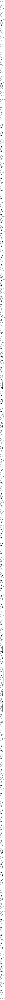

In [19]:
from IPython import display
display.Image('name_to_titles.png')

In [20]:
same_title_dict = {}
unique_title_list = []
for x in names_title_dict:
#     print((x))
    for unique_title in names_title_dict[x]:
        if unique_title not in unique_title_list:
            unique_title_list.append(unique_title)
    per_title_name_list = []
    for i in unique_title_list:
        
        if names_title_dict[x] == i:
            
            per_title_name_list.append(name_titles_dict[x])
        same_title_dict[i] = per_title_name_list
name = names_title_dict.keys()
title = same_title_dict.keys()
for title in same_title_dict:
#     print(title)
    name_list = []
#     print(name)
    for name in names_title_dict:
        if str(title) in names_title_dict[name] and name not in name_list:
#             print(name,title)
            name_list.append(name)
    same_title_dict[title] = name_list
            #     same_title_dict[title] = list((name))
same_title_dict

{'tt0072562': ['John Belushi',
  'Bill Murray',
  'Jim Belushi',
  'Dana Carvey',
  'Kevin Nealon',
  'Fred Armisen',
  'A. Whitney Brown',
  'Beth Cahill',
  'Pete Davidson',
  'Tom Davis',
  'Robin Duke',
  'Chris Elliott',
  'Al Franken',
  'Mary Gross',
  'Rich Hall',
  'Darrell Hammond',
  'Phil Hartman',
  'Yvonne Hudson',
  'Melanie Hutsell',
  'Leslie Jones',
  'Tim Kazurinsky',
  'Taran Killam',
  'Gary Kroeger',
  'Gail Matthius',
  'Kate McKinnon',
  'Tracy Morgan',
  'Garrett Morris',
  'Don Novello',
  "Michael O'Donoghue",
  'Joe Piscopo',
  'Amy Poehler',
  'Gilda Radner',
  'Jeff Richards',
  'Ann Risley',
  'Tim Robinson',
  'Tom Schiller',
  'Robert Smigel',
  'Kenan Thompson',
  'Dan Vitale',
  'Fred Wolf',
  'Alan Zweibel',
  'Seth Meyers',
  'Lauren Holt',
  'Bobby Moynihan',
  'Finesse Mitchell',
  'Mikey Day',
  'Andy Samberg',
  'Paul Brittain',
  'Colin Jost',
  'Abby Elliott',
  'John Milhiser',
  'Vanessa Bayer',
  'Noël Wells',
  'Luke Null',
  'Melissa Vill

In [21]:
G = pgv.AGraph(same_title_dict,
               strict=True,
               directed=False,
               rankdir="RL",
               ranksep="0.25",
               ordering="in")

G.layout('dot')

G.draw('title_to_names.png')

G.draw('title_to_names.svg')

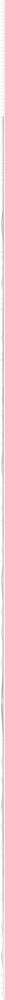

In [22]:
display.Image('title_to_names.png')

In [23]:
values = list(set([x for y in names_title_dict.values() for x in y]))
data = {}
for key in names_title_dict.keys():
    data[key] = [True if value in names_title_dict[key] else False for value in values]
 
boolean_table_name_cols = pd.DataFrame(data, index=values)
pd.DataFrame(boolean_table_name_cols)

,John Belushi,Dan Aykroyd,Bill Murray,Mike Myers,Chevy Chase,Billy Crystal,Joan Cusack,Robert Downey Jr.,Chris Farley,Janeane Garofalo,...,Ego Nwodim,Brooks Wheelan,Cecily Strong,Aidy Bryant,Chris Redd,Jim Downey,Bowen Yang,Andrew Dismukes,Siobhan Fallon,Punkie Johnson
tt0132347,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
tt5880050,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt1626811,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt3856408,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt5774044,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt0139239,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt3597448,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt2062966,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt5870978,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [24]:
# https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
values = list(set([x for y in same_title_dict.values() for x in y]))
data = {}
for key in same_title_dict.keys():
    data[key] = [ True if value in same_title_dict[key] else False for value in values ]
 
boolean_table_title_cols = pd.DataFrame(data, index=values)
pd.DataFrame(boolean_table_title_cols)

,tt0072562,tt0078723,tt0077975,tt0080455,tt0087332,tt0097428,tt0118747,tt2784678,tt3790306,tt0281438,...,tt2452244,tt2587452,tt6279022,tt14508698,tt13858722,tt6463510,tt5117666,tt7242698,tt5821764,tt7778796
Laraine Newman,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Bobby Moynihan,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Tracy Morgan,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Siobhan Fallon,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
Michael Che,True,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Danitra Vance,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Harry Shearer,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Michaela Watkins,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Amy Poehler,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


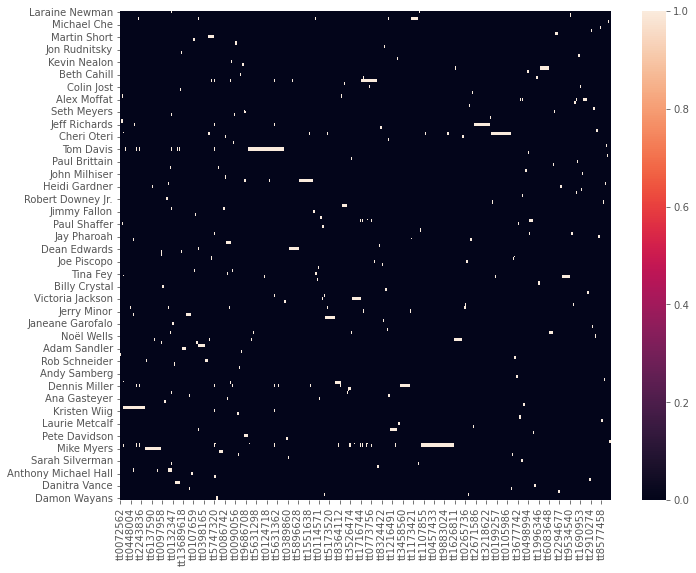

In [25]:
fig, ax = plt.subplots(figsize=(11, 9))
sb.heatmap(boolean_table_title_cols)
plt.show()

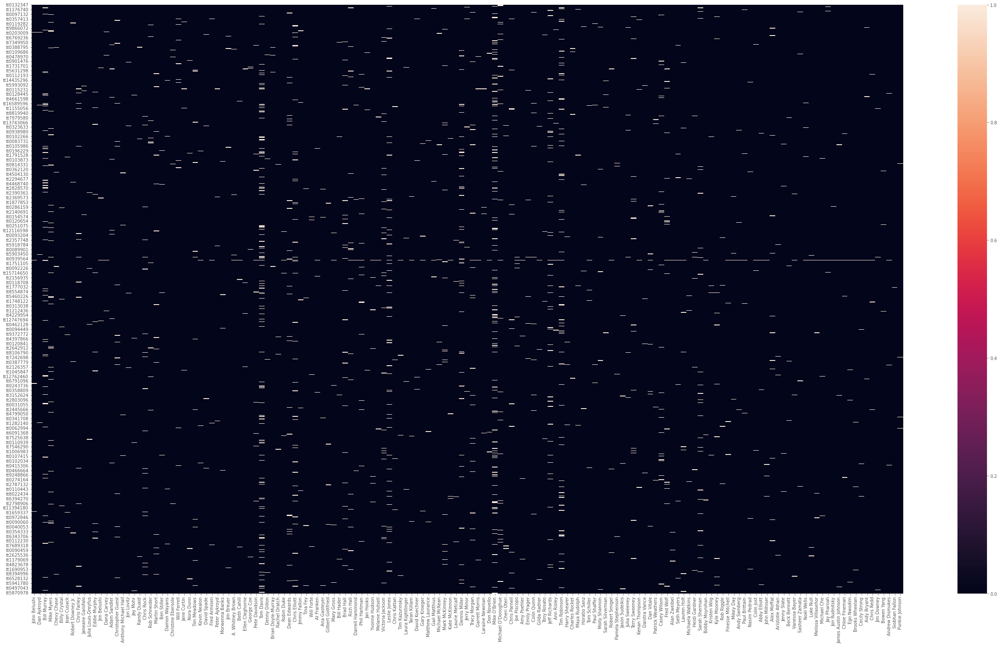

In [26]:
fig, ax = plt.subplots(figsize=(45, 25))
sb.heatmap(boolean_table_name_cols)
plt.show()

In [27]:
# ATTEMPT AT A NETWORK NODE GRAPH
# g = nx.DiGraph(same_title_dict)
# g.add_nodes_from(same_title_dict.keys())
# for k, v in same_title_dict.items():
#     g.add_edges_from(([(k, t) for t in v]))
#     node_trace = go.Scatter(
#     x=node_x, y=node_y,
#     mode='markers',
#     hoverinfo='text',
#     marker=dict(
#         showscale=True,
#         # colorscale options
#         #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
#         #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
#         #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
#         colorscale='YlGnBu',
#         reversescale=True,
#         color=[],
#         size=10,
#         colorbar=dict(
#             thickness=15,
#             title='Node Connections',
#             xanchor='left',
#             titleside='right'),
#         line_width=2))
# nx.draw(g,with_labels=True)

# node_adjacencies = []
# node_text = []
# for node, adjacencies in enumerate(g.adjacency()):
#     node_adjacencies.append(len(adjacencies[1]))
#     node_text.append('# of connections: '+str(len(adjacencies[1])))

# node_trace.marker.color = node_adjacencies
# node_trace.text = node_text
# # Create Network Graph
# fig = go.Figure(data=[edge_trace, node_trace],
#              layout=go.Layout(
#                 title='<br>Network graph made with Python',
#                 titlefont_size=24,
#                 showlegend=False,
#                 hovermode='closest',
#                 margin=dict(b=20,l=5,r=5,t=40),
#                 annotations=[ dict(
#                     text="Python code: <a href='https://plotly.com/ipython-notebooks/network-graphs/'> https://plotly.com/ipython-notebooks/network-graphs/</a>",
#                     showarrow=False,
#                     xref="paper", yref="paper",
#                     x=0.005, y=-0.002 ) ],
#                 xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
#                 yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))                )
# fig.show()

John Belushi ['tt0072562', 'tt0078723', 'tt0077975', 'tt0080455']
John Belushi
[True, True, True, True]
Dan Aykroyd
[False, False, False, True]
Bill Murray
[True, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[True, False, False, False]
Dana Carvey
[True, False, False, False]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
Mart

[False, False, False, False]
Peter Aykroyd
[False, False, False, False]
Morwenna Banks
[False, False, False, False]
Jim Breuer
[False, False, False, False]
A. Whitney Brown
[False, False, False, False]
Beth Cahill
[False, False, False, False]
Ellen Cleghorne
[False, False, False, False]
George Coe
[False, False, False, False]
Pete Davidson
[False, False, False, False]
Tom Davis
[False, False, False, False]
Denny Dillon
[False, False, False, False]
Brian Doyle-Murray
[False, False, False, False]
Rachel Dratch
[False, False, False, False]
Robin Duke
[False, False, False, False]
Dean Edwards
[False, False, False, False]
Chris Elliott
[False, False, False, False]
Jimmy Fallon
[False, False, False, False]
Tina Fey
[False, False, False, False]
Will Forte
[False, False, False, False]
Al Franken
[False, False, False, False]
Ana Gasteyer
[False, False, False, False]
Gilbert Gottfried
[False, False, False, False]
Mary Gross
[False, False, False, False]
Bill Hader
[False, False, False, False]
Bra

[True, False, False, False]
Cheri Oteri
[False, False, False, False]
Chris Parnell
[False, False, False, False]
Joe Piscopo
[True, False, False, False]
Amy Poehler
[True, False, False, False]
Emily Prager
[False, False, False, False]
Colin Quinn
[False, False, False, False]
Gilda Radner
[True, False, False, False]
Tony Rosato
[False, False, False, False]
Jeff Richards
[True, False, False, False]
Ann Risley
[True, False, False, False]
Tim Robinson
[True, False, False, False]
Harry Shearer
[False, False, False, False]
Charles Rocket
[False, False, False, False]
Maya Rudolph
[False, False, False, False]
Horatio Sanz
[False, False, False, False]
Tom Schiller
[True, False, False, False]
Paul Shaffer
[False, False, False, False]
Molly Shannon
[False, False, False, False]
Sarah Silverman
[False, False, False, False]
Robert Smigel
[True, False, False, False]
Pamela Stephenson
[False, False, False, False]
Jason Sudeikis
[False, False, False, False]
Julia Sweeney
[False, False, False, False]
Ter

Beck Bennett
[False, False, False, False]
Vanessa Bayer
[False, False, False, False]
Sasheer Zamata
[False, False, False, False]
Noël Wells
[False, False, False, False]
Luke Null
[False, False, False, False]
Melissa Villaseñor
[False, False, False, False]
Michael Che
[False, False, False, False]
Jay Pharoah
[False, False, False, False]
Jon Rudnitsky
[False, False, False, False]
James Austin Johnson
[False, False, False, False]
Chloe Fineman
[False, False, False, False]
Ego Nwodim
[False, False, False, False]
Brooks Wheelan
[False, False, False, False]
Cecily Strong
[False, False, False, False]
Aidy Bryant
[False, False, False, False]
Chris Redd
[False, False, False, False]
Jim Downey
[False, False, False, False]
Bowen Yang
[False, False, False, False]
Andrew Dismukes
[False, False, False, False]
Siobhan Fallon
[False, False, False, False]
Punkie Johnson
[False, False, False, False]
Chris Rock ['tt2784678', 'tt0325537', 'tt0198781', 'tt3644198', 'tt2357748', 'tt8106790', 'tt0434026', 't

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


 ['tt0115697', 'tt0110989', 'tt0086879', 'tt0993846']
John Belushi
[False, False, False, False]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[False, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[True, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[False, False, False, False]
Dana Carvey
[False, False, False, False]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
Martin Sh

Ego Nwodim
[True, False, False, False]
Brooks Wheelan
[True, False, False, False]
Cecily Strong
[True, False, False, False]
Aidy Bryant
[True, False, False, False]
Chris Redd
[True, False, False, False]
Jim Downey
[False, False, False, False]
Bowen Yang
[False, False, False, False]
Andrew Dismukes
[True, False, False, False]
Siobhan Fallon
[False, False, False, False]
Punkie Johnson
[False, False, False, False]
David Spade ['tt0120917', 'tt0114694', 'tt0245686', 'tt0437863']
John Belushi
[False, False, False, False]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[False, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, True, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Be

Tom Davis
[True, False, False, False]
Denny Dillon
[False, False, False, False]
Brian Doyle-Murray
[False, False, False, False]
Rachel Dratch
[False, False, False, False]
Robin Duke
[True, False, False, False]
Dean Edwards
[False, False, False, False]
Chris Elliott
[True, False, False, False]
Jimmy Fallon
[False, False, False, False]
Tina Fey
[False, False, False, False]
Will Forte
[False, False, False, False]
Al Franken
[True, False, False, False]
Ana Gasteyer
[False, False, False, False]
Gilbert Gottfried
[False, False, False, False]
Mary Gross
[True, False, False, False]
Bill Hader
[False, False, False, False]
Brad Hall
[False, False, False, False]
Rich Hall
[True, False, False, False]
Darrell Hammond
[True, False, False, False]
Phil Hartman
[True, False, False, False]
Jan Hooks
[False, False, False, False]
Yvonne Hudson
[True, False, False, False]
Melanie Hutsell
[True, False, False, False]
Victoria Jackson
[False, False, False, False]
Leslie Jones
[True, False, False, False]
Chris

[False, False, False, False]
Jeff Richards
[False, False, False, False]
Ann Risley
[False, False, False, False]
Tim Robinson
[False, False, False, False]
Harry Shearer
[False, False, False, False]
Charles Rocket
[False, False, False, False]
Maya Rudolph
[False, False, False, False]
Horatio Sanz
[False, False, False, False]
Tom Schiller
[False, False, False, False]
Paul Shaffer
[False, False, False, False]
Molly Shannon
[False, False, False, False]
Sarah Silverman
[False, False, False, False]
Robert Smigel
[False, False, False, False]
Pamela Stephenson
[False, False, False, False]
Jason Sudeikis
[False, False, False, False]
Julia Sweeney
[False, False, False, False]
Terry Sweeney
[False, False, False, False]
Kenan Thompson
[False, False, False, False]
Danitra Vance
[False, False, False, False]
Dan Vitale
[False, False, False, False]
Patrick Weathers
[False, False, False, False]
Casey Wilson
[False, False, False, False]
Fred Wolf
[False, False, False, False]
Alan Zweibel
[False, False, F

[False, False, False, False, False]
Chris Elliott
[False, False, False, False, False]
Jimmy Fallon
[True, True, True, True, True]
Tina Fey
[False, False, False, False, False]
Will Forte
[False, False, False, False, False]
Al Franken
[False, False, False, False, False]
Ana Gasteyer
[False, False, False, False, False]
Gilbert Gottfried
[False, False, False, False, False]
Mary Gross
[False, False, False, False, False]
Bill Hader
[False, False, False, False, False]
Brad Hall
[False, False, False, False, False]
Rich Hall
[False, False, False, False, False]
Darrell Hammond
[False, False, False, False, False]
Phil Hartman
[False, False, False, False, False]
Jan Hooks
[False, False, False, False, False]
Yvonne Hudson
[False, False, False, False, False]
Melanie Hutsell
[False, False, False, False, False]
Victoria Jackson
[False, False, False, False, False]
Leslie Jones
[False, False, False, False, False]
Chris Kattan
[False, False, False, False, False]
Tim Kazurinsky
[False, False, False, False

Gilbert Gottfried ['tt0103639', 'tt0100419', 'tt0092644', 'tt0098987']
John Belushi
[False, False, False, False]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[False, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[False, False, False, False]
Dana Carvey
[False, False, False, False]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False

Phil Hartman ['tt0072562', 'tt7286456', 'tt0108174', 'tt0116705', 'tt0122718', 'tt0112095', 'tt0844479', 'tt3960412', 'tt5884792', 'tt4662448', 'tt4828104', 'tt0409182', 'tt4701488', 'tt5298646', 'tt2417108']
John Belushi
[True, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Dan Aykroyd
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Bill Murray
[True, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Mike Myers
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Chevy Chase
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Billy Crystal
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Joan Cusack
[False, False, False, False, False, False, False, False, False, False, 

[False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Damon Wayans
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Christine Ebersole
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, F

Gary Kroeger ['tt0072562', 'tt0200525', 'tt0046593', 'tt0086765']
John Belushi
[True, False, False, False]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[True, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[True, False, False, False]
Dana Carvey
[True, False, False, False]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]


Heidi Gardner
[False, False, False, False, False]
Sarah Sherman
[False, False, False, False, False]
Bobby Moynihan
[False, True, False, False, False]
Kristen Wiig
[False, False, False, False, False]
Kyle Mooney
[False, False, False, False, False]
Rob Riggle
[False, False, False, False, False]
Finesse Mitchell
[False, True, False, False, False]
Mikey Day
[False, True, False, False, False]
Andy Samberg
[False, True, False, False, False]
Paul Brittain
[False, True, False, False, False]
Nasim Pedrad
[False, False, False, False, False]
Colin Jost
[False, True, False, False, False]
Abby Elliott
[False, True, False, False, False]
John Milhiser
[False, True, True, False, False]
Alex Moffat
[False, False, False, False, False]
Aristotle Athari
[False, False, False, False, False]
Jenny Slate
[False, False, False, False, False]
Beck Bennett
[False, False, False, False, False]
Vanessa Bayer
[False, True, False, False, False]
Sasheer Zamata
[False, False, False, False, False]
Noël Wells
[False, True

Joe Piscopo
[False, False, False, False]
Amy Poehler
[False, False, False, False]
Emily Prager
[False, False, False, False]
Colin Quinn
[False, False, False, False]
Gilda Radner
[False, False, False, False]
Tony Rosato
[False, False, False, False]
Jeff Richards
[False, False, False, False]
Ann Risley
[False, False, False, False]
Tim Robinson
[False, False, False, False]
Harry Shearer
[False, False, False, False]
Charles Rocket
[False, False, False, False]
Maya Rudolph
[False, False, False, False]
Horatio Sanz
[False, False, False, False]
Tom Schiller
[False, False, False, False]
Paul Shaffer
[False, False, False, False]
Molly Shannon
[False, False, False, False]
Sarah Silverman
[False, False, False, False]
Robert Smigel
[False, False, False, False]
Pamela Stephenson
[False, False, False, False]
Jason Sudeikis
[False, False, False, False]
Julia Sweeney
[False, False, False, False]
Terry Sweeney
[False, False, False, False]
Kenan Thompson
[False, False, False, False]
Danitra Vance
[False

[False, False, False, False, False, False]
Noël Wells
[True, False, False, False, False, False]
Luke Null
[True, False, False, False, False, False]
Melissa Villaseñor
[True, False, False, False, False, False]
Michael Che
[True, False, False, False, False, False]
Jay Pharoah
[True, False, False, False, False, False]
Jon Rudnitsky
[True, False, False, False, False, False]
James Austin Johnson
[True, False, False, False, False, False]
Chloe Fineman
[True, False, False, False, False, False]
Ego Nwodim
[True, False, False, False, False, False]
Brooks Wheelan
[True, False, False, False, False, False]
Cecily Strong
[True, False, False, False, False, False]
Aidy Bryant
[True, False, False, False, False, False]
Chris Redd
[True, False, False, False, False, False]
Jim Downey
[False, False, False, False, True, False]
Bowen Yang
[False, False, False, False, False, False]
Andrew Dismukes
[True, False, False, False, False, False]
Siobhan Fallon
[False, False, False, False, False, False]
Punkie Johns

[True, False, False, False]
Peter Aykroyd
[False, False, False, False]
Morwenna Banks
[False, False, False, False]
Jim Breuer
[False, False, False, False]
A. Whitney Brown
[True, False, False, False]
Beth Cahill
[True, False, False, False]
Ellen Cleghorne
[False, False, False, False]
George Coe
[False, False, False, False]
Pete Davidson
[True, False, False, False]
Tom Davis
[True, False, False, False]
Denny Dillon
[False, False, False, False]
Brian Doyle-Murray
[False, False, False, False]
Rachel Dratch
[False, False, False, False]
Robin Duke
[True, False, False, False]
Dean Edwards
[False, False, False, False]
Chris Elliott
[True, False, False, False]
Jimmy Fallon
[False, False, False, False]
Tina Fey
[False, False, False, False]
Will Forte
[False, False, False, False]
Al Franken
[True, False, False, False]
Ana Gasteyer
[False, False, False, False]
Gilbert Gottfried
[False, False, False, False]
Mary Gross
[True, False, False, False]
Bill Hader
[False, False, False, False]
Brad Hall
[F

Michael O'Donoghue
[True, False, False, False, False]
Cheri Oteri
[False, False, False, False, False]
Chris Parnell
[False, False, False, False, False]
Joe Piscopo
[True, False, False, False, False]
Amy Poehler
[True, False, False, False, False]
Emily Prager
[False, False, False, False, False]
Colin Quinn
[False, False, False, False, False]
Gilda Radner
[True, False, False, False, False]
Tony Rosato
[False, False, False, False, False]
Jeff Richards
[True, False, False, False, False]
Ann Risley
[True, False, False, False, False]
Tim Robinson
[True, False, False, False, False]
Harry Shearer
[False, False, False, False, False]
Charles Rocket
[False, False, False, False, False]
Maya Rudolph
[False, False, False, False, False]
Horatio Sanz
[False, False, False, False, False]
Tom Schiller
[True, True, True, True, True]
Paul Shaffer
[False, False, False, False, False]
Molly Shannon
[False, False, False, False, False]
Sarah Silverman
[False, False, False, False, False]
Robert Smigel
[True, Fal

Beck Bennett
[False, False, False, False]
Vanessa Bayer
[False, False, False, False]
Sasheer Zamata
[False, False, False, False]
Noël Wells
[False, False, False, False]
Luke Null
[False, False, False, False]
Melissa Villaseñor
[False, False, False, False]
Michael Che
[False, False, False, False]
Jay Pharoah
[False, False, False, False]
Jon Rudnitsky
[False, False, False, False]
James Austin Johnson
[False, False, False, False]
Chloe Fineman
[False, False, False, False]
Ego Nwodim
[False, False, False, False]
Brooks Wheelan
[False, False, False, False]
Cecily Strong
[False, False, False, False]
Aidy Bryant
[False, False, False, False]
Chris Redd
[False, False, False, False]
Jim Downey
[False, False, False, False]
Bowen Yang
[False, False, False, False]
Andrew Dismukes
[False, False, False, False]
Siobhan Fallon
[False, False, False, False]
Punkie Johnson
[False, False, False, False]
Julia Sweeney ['tt2467372', 'tt8106790', 'tt0498994', 'tt10417836', '\\N', 'tt8962130']
John Belushi
[Fal

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Kevin Nealon
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
David Spade
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Fred Armisen
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Peter Aykroyd
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Morwenna Banks
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, Fal

[False, False, False, False, False, False, False]
Don Novello
[False, False, False, False, False, False, False]
Mike O'Brien
[False, False, False, False, True, False, False]
Michael O'Donoghue
[False, False, False, False, False, False, False]
Cheri Oteri
[False, False, False, False, False, False, False]
Chris Parnell
[False, False, False, False, False, False, False]
Joe Piscopo
[False, False, False, False, False, False, True]
Amy Poehler
[False, False, False, False, False, False, False]
Emily Prager
[False, False, False, False, False, False, True]
Colin Quinn
[False, False, False, False, False, False, True]
Gilda Radner
[False, False, False, False, False, False, False]
Tony Rosato
[False, False, False, False, False, False, False]
Jeff Richards
[False, False, False, False, False, False, False]
Ann Risley
[False, False, False, False, False, False, False]
Tim Robinson
[False, False, False, False, False, False, False]
Harry Shearer
[False, False, False, False, False, False, False]
Charles 

[False, False, False, False]
Aristotle Athari
[False, False, False, False]
Jenny Slate
[False, False, False, False]
Beck Bennett
[False, False, False, False]
Vanessa Bayer
[True, False, False, False]
Sasheer Zamata
[False, False, False, False]
Noël Wells
[True, False, False, False]
Luke Null
[True, False, False, False]
Melissa Villaseñor
[True, False, False, False]
Michael Che
[True, False, False, False]
Jay Pharoah
[True, False, False, False]
Jon Rudnitsky
[True, False, False, False]
James Austin Johnson
[True, False, False, False]
Chloe Fineman
[True, False, False, False]
Ego Nwodim
[True, False, False, False]
Brooks Wheelan
[True, False, False, False]
Cecily Strong
[True, False, False, False]
Aidy Bryant
[True, False, False, False]
Chris Redd
[True, False, False, False]
Jim Downey
[False, False, False, False]
Bowen Yang
[False, False, False, False]
Andrew Dismukes
[True, False, False, False]
Siobhan Fallon
[False, False, False, False]
Punkie Johnson
[False, False, False, False]
Mike

Jane Curtin
[False, False, False, False]
Nora Dunn
[False, False, False, False]
Tim Meadows
[False, False, False, False]
Kevin Nealon
[True, False, False, False]
David Spade
[False, False, False, False]
Fred Armisen
[True, False, False, False]
Peter Aykroyd
[False, False, False, False]
Morwenna Banks
[False, False, False, False]
Jim Breuer
[False, False, False, False]
A. Whitney Brown
[True, False, False, False]
Beth Cahill
[True, False, False, False]
Ellen Cleghorne
[False, False, False, False]
George Coe
[False, False, False, False]
Pete Davidson
[True, False, False, False]
Tom Davis
[True, False, False, False]
Denny Dillon
[False, False, False, False]
Brian Doyle-Murray
[False, False, False, False]
Rachel Dratch
[False, False, False, False]
Robin Duke
[True, False, False, False]
Dean Edwards
[False, False, False, False]
Chris Elliott
[True, False, False, False]
Jimmy Fallon
[False, False, False, False]
Tina Fey
[False, False, False, False]
Will Forte
[False, False, False, False]
Al 

[False, False, False, False]
Tracy Morgan
[False, False, False, False]
Garrett Morris
[False, False, False, False]
Laraine Newman
[False, False, False, False]
Don Novello
[False, False, False, False]
Mike O'Brien
[False, False, False, False]
Michael O'Donoghue
[False, False, False, False]
Cheri Oteri
[False, False, False, False]
Chris Parnell
[False, False, False, False]
Joe Piscopo
[False, False, False, False]
Amy Poehler
[False, False, False, False]
Emily Prager
[False, False, False, False]
Colin Quinn
[False, False, False, False]
Gilda Radner
[False, False, False, False]
Tony Rosato
[False, False, False, False]
Jeff Richards
[False, False, False, False]
Ann Risley
[False, False, False, False]
Tim Robinson
[False, False, False, False]
Harry Shearer
[False, False, False, False]
Charles Rocket
[False, False, False, False]
Maya Rudolph
[False, False, False, False]
Horatio Sanz
[False, False, False, False]
Tom Schiller
[False, False, False, False]
Paul Shaffer
[False, False, False, False

[True, False]
Abby Elliott
[True, False]
John Milhiser
[True, False]
Alex Moffat
[False, False]
Aristotle Athari
[False, False]
Jenny Slate
[False, False]
Beck Bennett
[False, False]
Vanessa Bayer
[True, False]
Sasheer Zamata
[False, False]
Noël Wells
[True, False]
Luke Null
[True, False]
Melissa Villaseñor
[True, False]
Michael Che
[True, False]
Jay Pharoah
[True, False]
Jon Rudnitsky
[True, True]
James Austin Johnson
[True, False]
Chloe Fineman
[True, False]
Ego Nwodim
[True, False]
Brooks Wheelan
[True, False]
Cecily Strong
[True, False]
Aidy Bryant
[True, False]
Chris Redd
[True, False]
Jim Downey
[False, False]
Bowen Yang
[False, False]
Andrew Dismukes
[True, False]
Siobhan Fallon
[False, False]
Punkie Johnson
[False, False]
James Austin Johnson ['tt0072562', 'tt0475290', 'tt8036272', 'tt3032476']
John Belushi
[True, False, False, False]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[True, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, Fals

Damon Wayans
[False, False, False, False]
Christine Ebersole
[False, False, False, False]
Will Ferrell
[False, False, False, False]
Jane Curtin
[False, False, False, False]
Nora Dunn
[False, False, False, False]
Tim Meadows
[True, False, False, False]
Kevin Nealon
[False, True, False, False]
David Spade
[False, False, False, False]
Fred Armisen
[False, True, False, False]
Peter Aykroyd
[False, False, False, False]
Morwenna Banks
[False, False, False, False]
Jim Breuer
[False, False, False, False]
A. Whitney Brown
[False, True, False, False]
Beth Cahill
[False, True, False, False]
Ellen Cleghorne
[False, False, False, False]
George Coe
[False, False, False, False]
Pete Davidson
[False, True, False, False]
Tom Davis
[False, True, False, False]
Denny Dillon
[False, False, False, False]
Brian Doyle-Murray
[False, False, False, False]
Rachel Dratch
[False, False, False, False]
Robin Duke
[False, True, False, False]
Dean Edwards
[False, False, False, False]
Chris Elliott
[False, True, False,

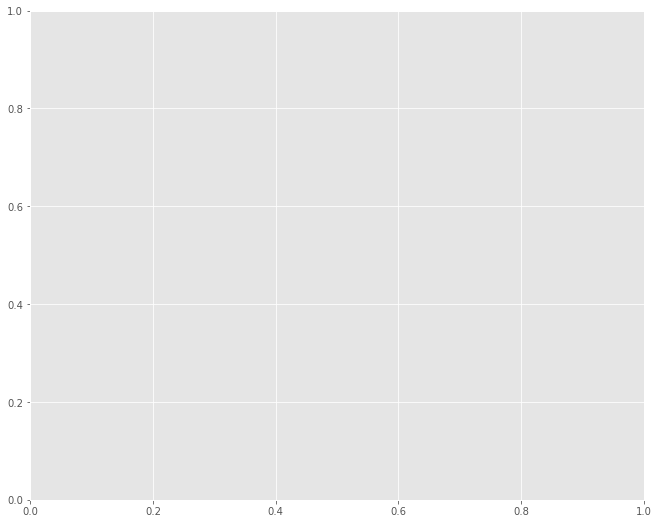

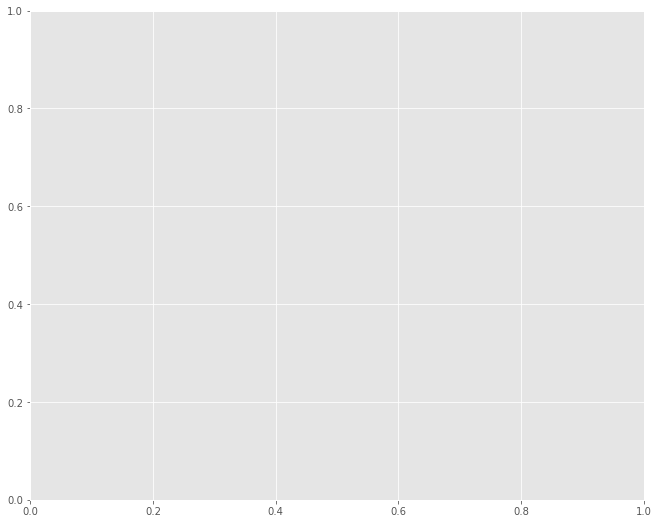

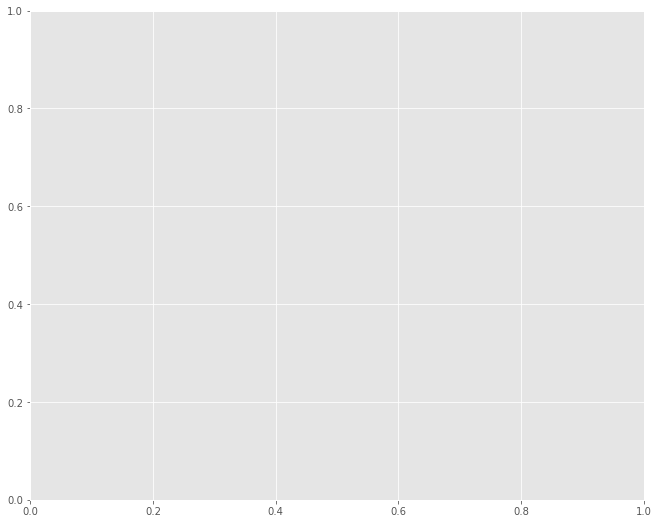

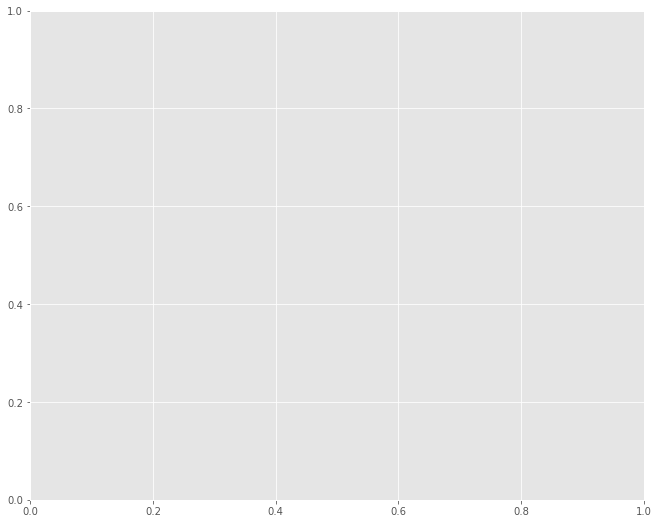

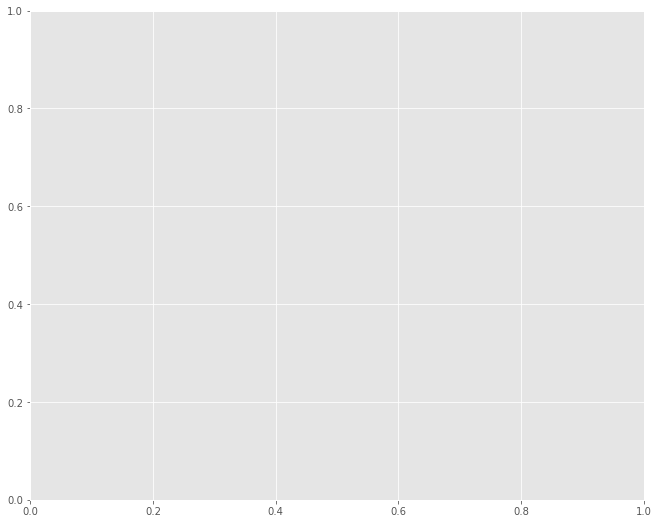

...

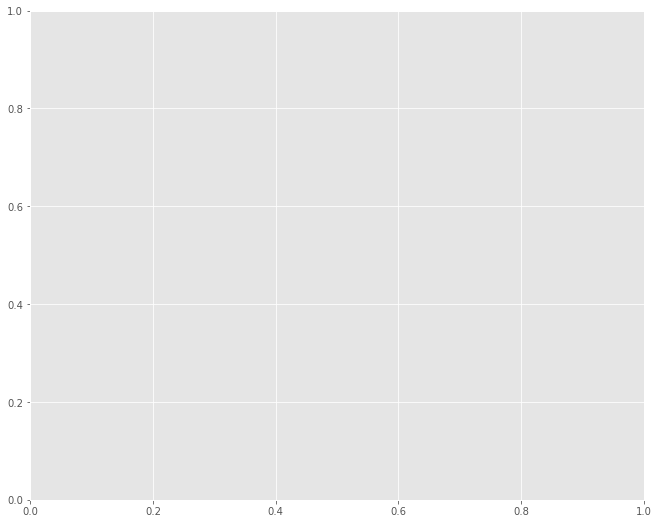

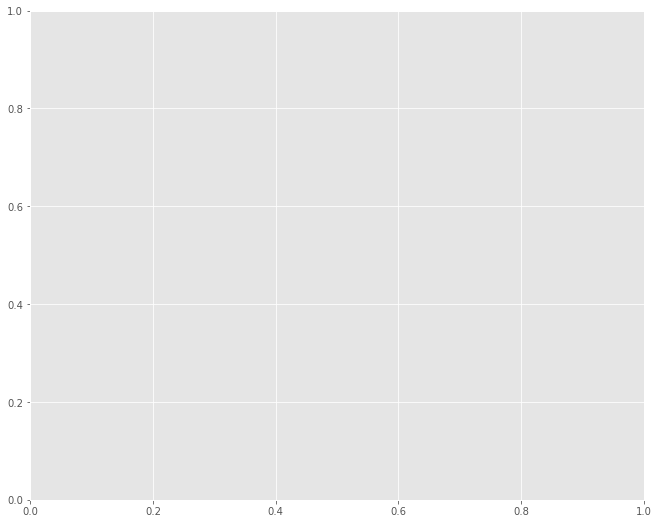

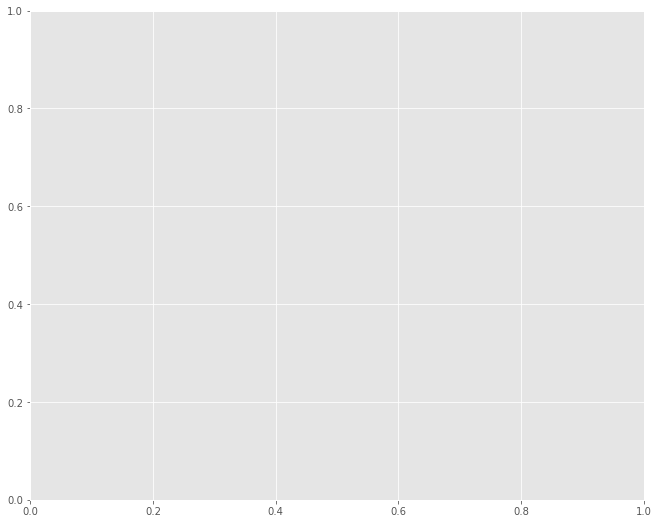

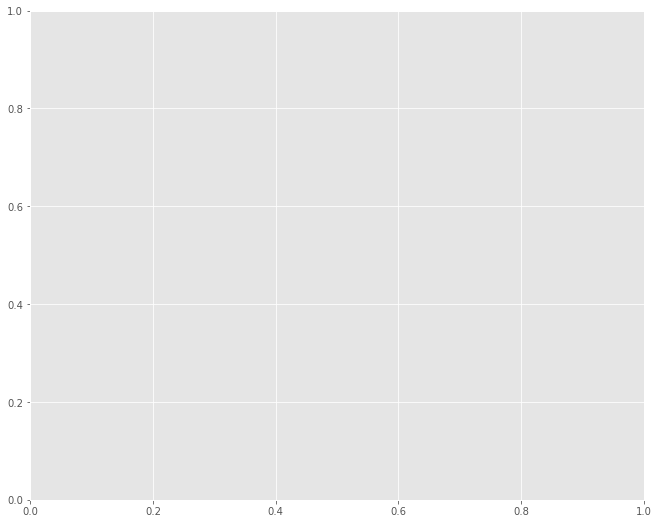

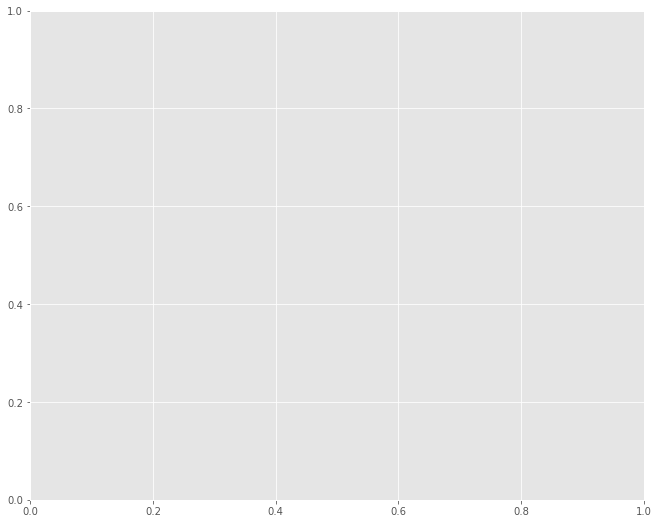

In [28]:
for actor in names_title_dict:
    fig, ax = plt.subplots(figsize=(11, 9))
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = names_title_dict[actor]
    print(actor,values)
    data = {}
    boolean_table_name_cols = pd.DataFrame(data, columns=values)

    for key in names_title_dict:
        print(key)
        data[actor] = [True if value in names_title_dict[key] else False for value in values]
        print(data[actor])
#         for index in boolean_table_name_cols:
#             boolean_table_name_cols.append(data[actor])
        boolean_table_name_cols
        
#         sb.heatmap(boolean_table_name_cols)
#     plt.GridSpec(boolean_table_title_cols,ncols=len(values))
#     plt.show()

In [141]:
data = {}
for actor in names_title_dict:
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = names_title_dict[actor]
    headers = values[:]
    headers.insert(0,actor)
#     print(headers)
#     print(values)

#     print(actor,values)
    
    actor_dict_2d = [headers]

    for key in names_title_dict:
#         print(key)
#         data[actor] = [True if value in names_title_dict[key] else False for value in values]
#         print(data[actor])
        t_or_f = [1 if value in names_title_dict[key] else 0 for value in values]
        t_or_f.insert(0,key)
        actor_dict_2d.append(t_or_f)
    data[actor] = actor_dict_2d
# print(data)

In [30]:
# table = pd.DataFrame(data['Kate McKinnon']).set_index(0)

# header = table.iloc[0]
# table.columns = header
# table = pd.DataFrame(table[1:], columns=header)
# wiki_cast.index

In [81]:
def create_table(i):
    table = pd.DataFrame(data[wiki_cast.iloc[i].name]).set_index(0)
    header = table.iloc[0]
    table.columns = header
    table = pd.DataFrame(table[1:], columns=header)
    return table
table = create_table(1)

In [134]:
def on_selection(change):
    if (change['owner'].selected) is not None and len(change['owner'].selected)==1: # only allow user to select one grid
            i = change['owner'].selected[0]

            myLabel.value = wiki_cast.iloc[i].name + ': ' + str(wiki_cast.iloc[i]['No. of seasons']) + ' seasons on SNL'
            table = create_table(i)
            heat_map.color = table.values.astype('float')
            heat_map.row = table.index.values.astype(str),
            heat_map.column = table.columns.values.astype(str)
#how to ignore if NoneType selected?

In [128]:
myLabel = ipywidgets.Label()

In [151]:
####### BAR PLOT ######
# 2. scales
x_scb = bqplot.OrdinalScale()
y_scb = bqplot.LinearScale()
# 3. axis 
x_axb = bqplot.Axis(label='SNL Cast Member', orientation = 'vertical',
                    scale=x_scb, label_offset = '115px',
                    tick_style={'font-size':'3px','text-anchor': 'end'},
                    padding = 0.25)
y_axb = bqplot.Axis(label='Number of Seasons on SNL',
                    scale=y_scb, label_offset = '40 px')

# 4. mark -- heatmap using out colors to map our data
no_SNL_seasons_bar = bqplot.Bars(orientation='horizontal',x=wiki_cast.index,
                                 y=wiki_cast['No. of seasons'],
                                 align='center',scales = {'x':x_scb,
                                                          'y':y_scb},
                                 interactions={"click": "select"},
                                 selected_style={"stroke": "green", 
                                                 "fill": "skyblue"})


margin = dict(top=0, bottom=50, left=140, right=0)


no_SNL_seasons_bar.observe(on_selection,'selected')

fig_bars = bqplot.Figure(marks=[no_SNL_seasons_bar],
                         axes=[x_axb, y_axb], fig_margin=margin)
fig_bars.axes[0].tick_style = {'text-anchor': 'end'}

fig_bars.layout.height = '1700px'
fig_bars.layout.width = '550px'
fig_bars

Figure(axes=[Axis(label='SNL Cast Member', label_offset='115px', orientation='vertical', scale=OrdinalScale(),…

In [152]:
table.values.astype(int)

array([[0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0,

In [153]:
##GRID HEAT MAP##

# 2. scales
col_sc = bqplot.OrdinalColorScale(scheme="Pastel1")
x_sc = bqplot.OrdinalScale()
y_sc = bqplot.OrdinalScale()

# 3. axis
col_ax = bqplot.ColorAxis(scale=col_sc, orientation='vertical', side='right', label = 'Color Scale')
x_ax = bqplot.Axis(scale=x_sc, label='Title IDs',tick_rotate=-90, tick_style ={'font-size':'8px'},  label_offset ='50px')
y_ax = bqplot.Axis(scale=y_sc, orientation='vertical', label='Actors',tick_offset = '50px',tick_style ={'font-size':'8px'}, label_offset ='50px')

# 4. marks
heat_map = bqplot.GridHeatMap(color = table.values.astype('float'),
                             row = table.index.values.astype(str),
                             column = table.columns.values.astype(str),scales = {'color': col_sc})

fig = bqplot.Figure(marks=[heat_map], axes=[col_ax,x_ax, y_ax])
fig.layout.height = '1700px'
fig.layout.width = '550px'

In [154]:
heat_map.keys

['_model_module',
 '_model_module_version',
 '_model_name',
 '_view_count',
 '_view_module',
 '_view_module_version',
 '_view_name',
 'anchor_style',
 'apply_clip',
 'color',
 'column',
 'column_align',
 'display_format',
 'display_legend',
 'enable_hover',
 'font_style',
 'interactions',
 'labels',
 'null_color',
 'opacity',
 'preserve_domain',
 'row',
 'row_align',
 'scales',
 'scales_metadata',
 'selected',
 'selected_style',
 'stroke',
 'tooltip',
 'tooltip_location',
 'tooltip_style',
 'unselected_style',
 'visible']

In [156]:
Label_bar = ipywidgets.VBox([myLabel,fig_bars])
myDashboard = ipywidgets.HBox([Label_bar,fig])
myDashboard

My dashboard is used to see the frequency of collaboration amongst SNL cast members. The left part of the graph is a bar chart, representing the length of tenure at SNL. When a user clicks on a cast member's bar, the heat map on the right gets updated. At the moment, the order is inconsistent between the two portions of the graph. This iteration of the heat map is more of a representation of the overlap between IMDb 'Known For Titles,' which are the group of four or five top titles on an actor's (or director, producer, etc.) resume/page. I've also opted not to include the titles since they are currently just IMDb unique title IDs and wouldn't mean anything to a viewer. I am in the process of compiling the complete list of titles for every SNL cast member by scraping their wikipedia filmography tables (the file in which I do that is included in the zipped submission file). The next iteration of my dashboard will hopefully include these complete lists for each actor. I also plan to include a hover interaction feature for the heat map where a label will be updated to show the comparative actor's name in addition to the project that each box represents. In the current iteration, the row which is filled in completely filled in green represents the row of the actor whose bar was just selected.